In [45]:
import matplotlib
import torch
import torch.nn.functional as F
from torchdiffeq import odeint
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
import numpy as np
from IPython.display import clear_output
import torch.nn as nn
import torch.optim as optim
from tqdm.notebook import tqdm

In [46]:
class DoublePendulumODE(torch.nn.Module):
    def forward(self, t, z):
        """
        Defines the equations of motion for the double pendulum.

        Arguments:
        t: The independent variable (time).
        z: The state vector z = [theta1, theta2, p1, p2] where
            theta1, theta2: The angles of the pendulums.
            p1, p2: The angular momenta of the pendulums.

        Returns:
        dzdt: The time derivatives of the state vector z.
        """
        theta1, theta2, p1, p2 = z
        m1 = 0.5  # mass of pendulum 1
        m2 = 0.5  # mass of pendulum 2
        g = 9.8  # acceleration due to gravity
        l1 = 1.0  # length of pendulum 1
        l2 = 1.0  # length of pendulum 2

        # Convert angles to radians
        theta1_rad = torch.deg2rad(theta1)
        theta2_rad = torch.deg2rad(theta2)

        # Equations of motion
        theta1_dot = p1 / (m1 * l1 ** 2)
        theta2_dot = p2 / (m2 * l2 ** 2)

        p1_dot = (
            -m2 * l1 * l2 * theta2_dot ** 2 * torch.sin(theta1_rad - theta2_rad)
            - (m1 + m2) * g * torch.sin(theta1_rad) / l1
        )
        p2_dot = (
            m2 * l1 * l2 * theta1_dot ** 2 * torch.sin(theta1_rad - theta2_rad)
            - m2 * g * torch.sin(theta2_rad) / l2
        )

        dzdt = torch.tensor([theta1_dot, theta2_dot, p1_dot, p2_dot])
        return dzdt

In [47]:
a = torch.deg2rad(torch.tensor([140.,120.]))
a

tensor([2.4435, 2.0944])

In [48]:
# Initial conditions
z0 = torch.tensor([2.4435, 2.0944, 0., 0.])  # [theta1, theta2, p1, p2]
# Pendulum lengths
l1 = 1.0
l2 = 1.0
# Time points
t = torch.linspace(0, 100, 1000)

# Solve the ODE
solution = odeint(DoublePendulumODE(), z0, t,method='rk4')

In [49]:
# Extract the angles
theta1 = solution[:, 0]
theta2 = solution[:, 1]

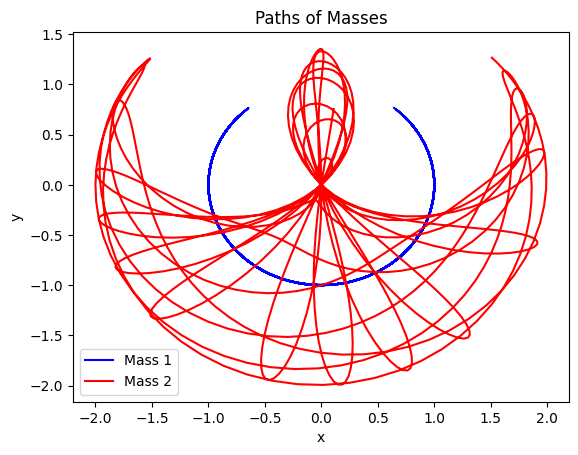

In [50]:
theta1_trajectory = []
theta2_trajectory = []
x1_trajectory = []
y1_trajectory = []
x2_trajectory = []
y2_trajectory = []

# Store the trajectories
for i in range(len(t)):
    theta1_trajectory.append(theta1[i].item())
    theta2_trajectory.append(theta2[i].item())

    # Compute the Cartesian coordinates of the pendulum
    x1 = l1 * torch.sin(theta1[i])
    y1 = -l1 * torch.cos(theta1[i])
    x2 = x1 + l2 * torch.sin(theta2[i])
    y2 = y1 - l2 * torch.cos(theta2[i])

    # Append coordinates to the trajectory lists
    x1_trajectory.append(x1.item())
    y1_trajectory.append(y1.item())
    x2_trajectory.append(x2.item())
    y2_trajectory.append(y2.item())

# Create a separate figure and axes for the paths of the masses
fig_paths, ax_paths = plt.subplots()

# Plot the paths of the masses
ax_paths.plot(x1_trajectory, y1_trajectory, 'b-', label='Mass 1')
ax_paths.plot(x2_trajectory, y2_trajectory, 'r-', label='Mass 2')
ax_paths.set_xlabel('x')
ax_paths.set_ylabel('y')
ax_paths.set_title('Paths of Masses')
ax_paths.legend()

# Display the paths plot
plt.show()

In [51]:
def animate(i):
    # Clear the plot
    ax.cla()

    # Get the angles for the current time step
    theta1 = solution[i, 0].item()
    theta2 = solution[i, 1].item()

    # Convert angles to tensors
    theta1 = torch.tensor(theta1)
    theta2 = torch.tensor(theta2)

    # Compute the Cartesian coordinates of the pendulum
    x1 = l1 * torch.sin(theta1)
    y1 = -l1 * torch.cos(theta1)
    x2 = x1 + l2 * torch.sin(theta2)
    y2 = y1 - l2 * torch.cos(theta2)

    # Plot the pendulum
    ax.plot([0, x1], [0, y1], 'b-', lw=2)  # Rod 1
    ax.plot(x1, y1, 'bo', markersize=5)    # Mass 1
    ax.plot([x1, x2], [y1, y2], 'b-', lw=2)  # Rod 2
    ax.plot(x2, y2, 'ro', markersize=5)    # Mass 2

    # Set plot limits and aspect ratio
    ax.set_xlim(-l1 - l2 - 0.5, l1 + l2 + 0.5)
    ax.set_ylim(-l1 - l2 - 0.5, l1 + l2 + 0.5)
    ax.set_aspect('equal', adjustable='box')



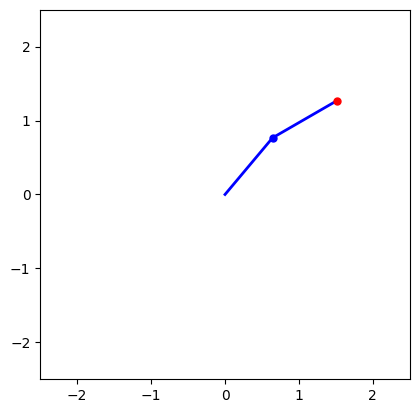

In [52]:
# Create a figure and axes
fig, ax = plt.subplots()

# Animate the pendulum
animation = FuncAnimation(fig, animate, frames=len(t), interval=50)

# Convert animation to HTML
html_animation = animation.to_jshtml()

# Display the animation
HTML(html_animation)

In [53]:
class PendulumTrain(nn.Module):
    """
    neural network for learning the chaotic lorenz system
    """
    def __init__(self):
        super(PendulumTrain, self).__init__()
        self.lin = nn.Linear(4, 256)
        self.lin2 = nn.Linear(256, 4)
        self.lrelu = nn.LeakyReLU()

    def forward(self, t, x):
        x = self.lrelu(self.lin(x))
        x = self.lin2(x)
        return x
     

In [54]:
solution[0]

tensor([2.4435, 2.0944, 0.0000, 0.0000])

In [55]:
train_data = solution

In [56]:
func = PendulumTrain()

In [57]:
optimizer = optim.Adam(func.parameters(), lr=1e-2)

In [58]:
def get_batch(true_y, batch_size):
    num_samples = len(true_y)
    indices = np.random.choice(np.arange(num_samples - batch_size, dtype=np.int64), size=batch_size, replace=False)
    indices.sort()
    batch_y0 = true_y[indices]  # (batch_size, D)
    batch_t = t[:batch_size]  # (batch_size)
    batch_y = torch.stack([true_y[indices + i] for i in range(batch_size)], dim=0)  # (batch_size, M, D)
    return batch_y0, batch_t, batch_y

In [59]:
batch_y0, batch_t, batch_y = get_batch(train_data,50)

In [60]:
batch_y0.shape,batch_t.shape,batch_y.shape

(torch.Size([50, 4]), torch.Size([50]), torch.Size([50, 50, 4]))

In [61]:
for itr in range(1, 1000 + 1):
    optimizer.zero_grad()
    batch_y0, batch_t, batch_y = get_batch(train_data,50)  # getting trajectory batch
    pred_y = odeint(func, batch_y0, batch_t)  # prediction using batch initial condition and batch time stamps
    loss = F.mse_loss(pred_y, batch_y)
    loss.backward()
    optimizer.step()
   
    if itr % 100 == 0:
        if itr > 1800:
            optimizer.param_groups[0]['lr'] = 1e-3
        with torch.no_grad():
            pred_y = odeint(func, train_data[0], t)
            loss = F.mse_loss(pred_y, train_data)
            print('Iter {:04d} | Total Loss {:.6f}'.format(itr, loss.item()))
            #clear_output(wait=True)


Iter 0100 | Total Loss 0.436521
Iter 0200 | Total Loss 0.024012
Iter 0300 | Total Loss 0.010231
Iter 0400 | Total Loss 0.054498
Iter 0500 | Total Loss 0.079603
Iter 0600 | Total Loss 0.027850
Iter 0700 | Total Loss 0.001612
Iter 0800 | Total Loss 0.022325
Iter 0900 | Total Loss 0.002935
Iter 1000 | Total Loss 0.031496


In [62]:
import os

In [63]:
t_p = torch.linspace(0, 200, 2000)

In [64]:
t_p.shape

torch.Size([2000])

In [65]:
pred = odeint(func, z0, t_p)

In [66]:
# Extract the angles
theta1 = pred[:, 0]
theta2 = pred[:, 1]

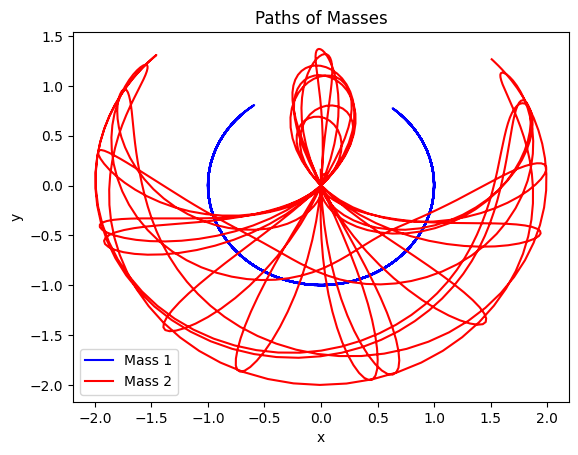

In [67]:
theta1_trajectory = []
theta2_trajectory = []
x1_trajectory = []
y1_trajectory = []
x2_trajectory = []
y2_trajectory = []

# Store the trajectories
for i in range(len(t)):
    theta1_trajectory.append(theta1[i].item())
    theta2_trajectory.append(theta2[i].item())

    # Compute the Cartesian coordinates of the pendulum
    x1 = l1 * torch.sin(theta1[i])
    y1 = -l1 * torch.cos(theta1[i])
    x2 = x1 + l2 * torch.sin(theta2[i])
    y2 = y1 - l2 * torch.cos(theta2[i])

    # Append coordinates to the trajectory lists
    x1_trajectory.append(x1.item())
    y1_trajectory.append(y1.item())
    x2_trajectory.append(x2.item())
    y2_trajectory.append(y2.item())

# Create a separate figure and axes for the paths of the masses
fig_paths, ax_paths = plt.subplots()

# Plot the paths of the masses
ax_paths.plot(x1_trajectory, y1_trajectory, 'b-', label='Mass 1')
ax_paths.plot(x2_trajectory, y2_trajectory, 'r-', label='Mass 2')
ax_paths.set_xlabel('x')
ax_paths.set_ylabel('y')
ax_paths.set_title('Paths of Masses')
ax_paths.legend()

# Display the paths plot
plt.show()

In [68]:
import random
start_index = random.randint(0, len(train_data) - 100)
    
    # Get a random continuous chunk of size 100 from train_data
chunk = train_data[start_index : start_index + 100]

In [69]:
p1 = pred[:, 0].detach().numpy()
p2 = pred[:, 1].detach().numpy()

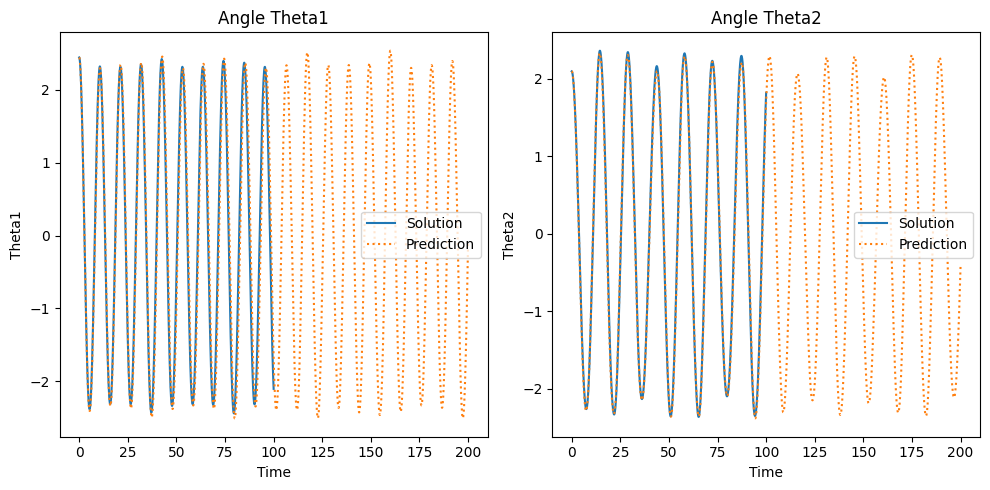

In [70]:
theta1 = solution[:, 0].detach().numpy()
theta2 = solution[:, 1].detach().numpy()

# Create separate plots for theta1 and theta2
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.plot(t, theta1, label='Solution')
plt.plot(t_p, p1, linestyle='dotted', label='Prediction')
plt.xlabel('Time')
plt.ylabel('Theta1')
plt.title('Angle Theta1')
plt.legend()

# Plot for theta2
plt.subplot(1, 2, 2)
plt.plot(t, theta2, label='Solution')
plt.plot(t_p, p2, linestyle='dotted', label='Prediction')
plt.xlabel('Time')
plt.ylabel('Theta2')
plt.title('Angle Theta2')
plt.legend()

# Adjust subplot spacing
plt.tight_layout()

# Display the plots
plt.show()